# <font color=darkblue> SmartTweet Text</font>

#### <font color=black> Importations de base</font>

In [1]:
import csv
import json
import tweepy
import keras as K
import numpy as np
from tweepy import OAuthHandler

#pour executer sur le GPU
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '5'

Using TensorFlow backend.


## <font color=darkred> Création de la base de donnée</font>

#### <font color=black> Code pour afficher dans terminal les tweets</font>

In [7]:
user = 'VictoriasSecret'
MAX = 10

consumer_key = 'gew1sBaXeilUZICE0Dx9X45Go'
consumer_secret = 'MPd6XZ8yLPzGsW0S5dYpqCCGKNU08rryMOGWQ2PaDXVvVVfJCB'
access_token = '732298075440599041-1o5r3u0kGTIP7Cl6kLqj3rtbIorETYH'
access_secret = 'b7PT0ofY21BRNTBOEG4HOzcDUhGaSBdqZcmYJblyEj6C5'
auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
api = tweepy.API(auth)
tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
api = tweepy.API(auth)


ListFashion = ['VictoriasSecret', 'hm', 'Dior', 'LouisVuitton', 'LouboutinWorld', 'FashionWeek', 'TwitterFashion', 'EurFashion', 'fmd1_com', 'PaulSmithDesign', 'GuardianFashion']

def printData (List):
    for user in List :
        i = 0
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')

        print('Send by : ', user)
        print('')
        print(tweets)

        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                i +=1
                print('Tweet', i)
                print('text :', t.full_text)
            

                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        print('media :',  image['media_url'])
                print('')
def getText (List):
    list = []
    for user in List :
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                list.append(t.full_text) 
    return (list)   

def getImage(List):
    list = []
    for user in List :
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        for t in tweets :
            if 'media' in t.entities:
                for image in  t.entities['media']:
                    list.append(image['media_url'])
    return (list)  

In [8]:
List1=['VictoriasSecret']
printData (List1)

Send by :  VictoriasSecret

[Status(_api=<tweepy.api.API object at 0x7f3963bcd7f0>, _json={'created_at': 'Sat Apr 04 15:52:10 +0000 2020', 'id': 1246465593986998273, 'id_str': '1246465593986998273', 'full_text': '@DearBritney_ily We would like to learn more, so we can share your feedback. Please DM us and elaborate. Include your full name, billing address, &amp; email. Thank you!', 'truncated': False, 'display_text_range': [17, 169], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'DearBritney_ily', 'name': 'Wade †', 'id': 399260964, 'id_str': '399260964', 'indices': [0, 16]}], 'urls': []}, 'source': '<a href="https://www.spredfast.com/" rel="nofollow">Khoros</a>', 'in_reply_to_status_id': 1246464272181452803, 'in_reply_to_status_id_str': '1246464272181452803', 'in_reply_to_user_id': 399260964, 'in_reply_to_user_id_str': '399260964', 'in_reply_to_screen_name': 'DearBritney_ily', 'user': {'id': 16193578, 'id_str': '16193578', 'name': "Victoria's Secret", 's

#### <font color=black> Ecrit les tweets dans le document tweet.csv</font>

In [3]:
ListFashion = ['VictoriasSecret', 'hm', 'Dior', 'LouisVuitton', 'LouboutinWorld', 'FashionWeek', 'TwitterFashion', 'EurFashion', 'fmd1_com', 'PaulSmithDesign', 'GuardianFashion']
ListHealth =['NCICancerBio', 'NICEcomms', 'WHO', 'HarvardHealth', 'bbchealth', 'NYTHealth', 'MayoClinic', 'NIH', 'HHSGov', 'CDCgov']
ListTech =['nvidia', 'techreview', 'AndroidAuth', 'kingstontech', 'intel', 'Cisco', 'Huawei', 'awscloud', 'github', 'Docker']
ListSport =['USPORTSca', 'FIFAcom', 'AllBlacks', 'Wimbledon', 'SportsCenter', 'FISU', 'NBCSports', 'SportsDirectUK', 'ClemsonTigers', 'SkySportsStatto']
ListCooking =['LeanCuisine', 'Bocusedor', 'CookingChannel', 'vegancook101', 'taste_cooking', 'TheJoyofCooking', 'NEFFHomeUK', 'FoodNetwork']
ListMusic =['Spotify', 'davidguetta', 'Deezer', 'QueenWillRock', 'thebeatles', 'MartinGarrix', 'SoundCloud', 'AppleMusic']
ListVideogames =['TeamVitality', 'amazongames', 'VGArtAndTidbits', 'anthemgame', 'VideoArtGame', 'onepiece_games', 'GreenManGaming', 'didyouknowgamin', 'Area51Gaming', 'SXSWGaming']
ListPolitic =['PnPCBC', 'business', 'BarackObama', 'HillaryClinton', 'theresa_may', 'NATO', 'UN', 'EU_Commission', 'wef', 'Europarl_EN']
ListScience =['esa', 'NASA', 'NaturePhysics', 'ScienceNews', 'newscientist', 'sciam', 'sciencemagazine', 'BBCScienceNews', 'MoMath1', 'centerofmath']
ListCinema = ['TheAcademy', 'ParamountPics', 'UniversalPics', 'wbpictures', 'SonyPictures', 'netflix', 'DisneyStudios', 'THR']

In [23]:
MAX = 1000
with open('tweet.csv', 'w', newline='') as csvfile:
    spamwriter = csv.writer(csvfile, delimiter=',',
                            quotechar='"', quoting=csv.QUOTE_MINIMAL)
    spamwriter.writerow(['Compte_twiter ','classe ', 'texte ', 'url de l_image '])
    for user in ListFashion:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')

        

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Fashion', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Fashion', tweet, None ])
    for user in ListHealth:
            tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')

            #on suppose qu'il y a toujours du texte
            for t in tweets :
                if (t.in_reply_to_status_id_str==None):
                    tweet= t.full_text.encode("utf-8")
                    if 'media' in t.entities:
                        for image in  t.entities['media']:
                            spamwriter.writerow([user, 'Health', tweet, image['media_url'] ])
                    else:
                            spamwriter.writerow([user, 'Health', tweet, None ])
    for user in ListTech:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Tech', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Tech', tweet, None ])
    for user in ListSport:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Sport', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Sport', tweet, None ])
    for user in ListCooking:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Cooking', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Cooking', tweet, None ])
    for user in ListMusic:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Music', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Music', tweet, None ])
    for user in ListVideogames:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Videogames', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Videogames', tweet, None ])
    for user in ListPolitic:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Politic', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Politic', tweet, None ])
    for user in ListScience:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Science', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Science', tweet, None ])
    for user in ListCinema:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')
        
        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        spamwriter.writerow([user, 'Cinema', tweet, image['media_url'] ])
                else:
                        spamwriter.writerow([user, 'Cinema', tweet, None ])

#### <font color=black> Ecrit les tweets sous des en-têtes dans le document tweet2.csv</font>

In [7]:
MAX = 10000
with open('tweet2.csv', 'w', newline='') as csvfile:
    fieldnames = ['Compte_twiter ','classe ', 'texte ', 'url de l_image ']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

    writer.writeheader()
    for user in ListFashion:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Fashion', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Fashion', 'texte ': tweet, 'url de l_image ': None})
    for user in ListHealth:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Health', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Health', 'texte ': tweet, 'url de l_image ': None})
    for user in ListTech:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Tech', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Tech', 'texte ': tweet, 'url de l_image ': None})
    for user in ListSport:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Sport', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Sport', 'texte ': tweet, 'url de l_image ': None})
    for user in ListCooking:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Cooking', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Cooking', 'texte ': tweet, 'url de l_image ': None})
    for user in ListMusic:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Music', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Music', 'texte ': tweet, 'url de l_image ': None})
    for user in ListVideogames:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Videogames', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Videogames', 'texte ': tweet, 'url de l_image ': None})
    for user in ListPolitic:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Politic', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Politic', 'texte ': tweet, 'url de l_image ': None})
    for user in ListScience:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Science', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Science', 'texte ': tweet, 'url de l_image ': None})
    for user in ListCinema:
        tweets = api.user_timeline(screen_name=user, count=MAX, tweet_mode='extended')      

        #on suppose qu'il y a toujours du texte
        for t in tweets :
            if (t.in_reply_to_status_id_str==None):
                tweet= t.full_text.encode("utf-8")
                if 'media' in t.entities:
                    for image in  t.entities['media']:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Cinema', 'texte ': tweet, 'url de l_image ': image['media_url']})

                else:
                        writer.writerow({'Compte_twiter ': user, 'classe ': 'Cinema', 'texte ': tweet, 'url de l_image ': None})

## <font color=darkred> Mise en forme des données</font>

#### <font color=black> Importations </font>

In [2]:
import nltk
from nltk import word_tokenize 
from tensorflow.keras.initializers import Constant
from tensorflow.keras.layers import Embedding

#### <font color=black> Fonction permettant de tokenizer un tweet</font>

In [13]:
nltk.download('punkt')

with open('tweet2.csv', 'r') as csvfile:
    reader = csv.DictReader(csvfile)
    for row in reader:
        tweet = row["texte "]
        print("Tweet: %s" % tweet)
        tokens = word_tokenize(tweet)
        print(tokens)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\alice\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


Tweet: b'Better together: lace &amp; cutouts. https://t.co/BbBVzCNb0t https://t.co/LXVRHZ7Fcp'
["b'Better", 'together', ':', 'lace', '&', 'amp', ';', 'cutouts', '.', 'https', ':', '//t.co/BbBVzCNb0t', 'https', ':', '//t.co/LXVRHZ7Fcp', "'"]
Tweet: b'Too much of a good thing? Never. Buy 3, get 3 FREE panties on now. Excl. apply: https://t.co/B5CeeIfata https://t.co/2rZdFfrTuE'
["b'Too", 'much', 'of', 'a', 'good', 'thing', '?', 'Never', '.', 'Buy', '3', ',', 'get', '3', 'FREE', 'panties', 'on', 'now', '.', 'Excl', '.', 'apply', ':', 'https', ':', '//t.co/B5CeeIfata', 'https', ':', '//t.co/2rZdFfrTuE', "'"]
Tweet: b'Does your bra collection need a refresh? Buy 2, get 1 FREE is on now. Excl. apply: https://t.co/Qgj0MAptp7 https://t.co/RhoF5g9qhj'
["b'Does", 'your', 'bra', 'collection', 'need', 'a', 'refresh', '?', 'Buy', '2', ',', 'get', '1', 'FREE', 'is', 'on', 'now', '.', 'Excl', '.', 'apply', ':', 'https', ':', '//t.co/Qgj0MAptp7', 'https', ':', '//t.co/RhoF5g9qhj', "'"]
Tweet: b'Everyt

#### <font color=black> Charge le model Glove</font>

In [3]:
#on a telecharger glove.twitter.27B.zip

file = "glove.twitter.27B.100d.txt"

def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    
     
    with open(gloveFile, encoding="utf8" ) as f:
        content = f.readlines()
    model = {}
    for line in content:
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
     
     
model_glove= loadGloveModel(file)   


Loading Glove Model
Done. 1193514  words loaded!


#### <font color=black> Différentes fonctions nécessaire à l'écriture de la première couche en utilisant Glove</font>

In [3]:
EMBEDDING_DIM = 100

file = "glove.twitter.27B.100d.txt"

def get_embeddings_index(gloveFile):
    print('Indexing word vectors.')

    embeddings_index = {}
    with open(gloveFile , encoding='utf-8') as f:
        for line in f:
            word, coefs = line.split(maxsplit=1)
            coefs = np.fromstring(coefs, 'f', sep=' ')
            embeddings_index[word] = coefs

    print('Found {} word vectors.'.format(len(embeddings_index)))
    return embeddings_index


def get_embedding_matrix(num_words, max_num_words, word_index, gloveFile):
    embeddings_index = get_embeddings_index(gloveFile)

    embedding_matrix = np.zeros((num_words, EMBEDDING_DIM))
    for word, i in word_index.items():
        if i >= max_num_words:
            continue
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            # words not found in embedding index will be all-zeros.
            embedding_matrix[i] = embedding_vector

    return embedding_matrix

def get_pre_trained_embedding_layer(num_words, embedding_matrix, max_sequence_length):
    return Embedding(num_words, EMBEDDING_DIM, embeddings_initializer=Constant(embedding_matrix),
                     input_length=max_sequence_length, trainable=False, name='embedded_sequence')

#### <font color=black> Fonction permettant de récuper le texte et la classe de notre base de donnée</font>

In [5]:
import csv
def get_texts_labels():
    texts=[]
    labels=[]
    with open('tweet2.csv', newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            texts.append(row['texte '])
            labels.append(row['classe '])
    return texts, labels
        

#### <font color=black> Fonction qui permet de vectoriser les classes </font>

In [4]:
def vector_label(a):
    ListLabel=['Fashion', 'Health', 'Tech', 'Sport', 'Cooking', 'Music', 'Videogames', 'Politic', 'Science', 'Cinema']
    c=[0]*10
    for i in range(0,10):
        if(a==ListLabel[i]):
            c[i]=1
    return c
        

## <font color=darkred> Ecriture du réseau de classification du texte</font>

#### <font color=black> Importations </font>

In [5]:
# ignore warnings for better clarity (may not be the best thing to do)...
import warnings
warnings.filterwarnings('ignore')

from random import randint
import tensorflow as tf
import keras
from keras.datasets import mnist
from keras.models import Sequential

from keras import activations
import matplotlib.pyplot as plt

from keras.datasets import cifar100

from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Flatten, Conv1D, Input, BatchNormalization, GlobalAveragePooling1D, Dropout, GlobalMaxPooling1D
from tensorflow.keras.layers import Conv2D, GlobalMaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

from keras.datasets import mnist, boston_housing
from sklearn.preprocessing import MinMaxScaler

#### <font color=black> Séparition des données d'entrainement et de texte et mise en forme </font>

In [23]:
MAX_SEQUENCE_LENGTH = 140
MAX_NUM_WORDS = 20000

# first, prepare text samples and their labels

texts, labels = get_texts_labels()


# finally, vectorize the text samples into a 2D integer tensor
tokenizer = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)
word_index = tokenizer.word_index
data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH, padding='post')


# split the data into a training set and a validation set
ListLabel=['Fashion', 'Health', 'Tech', 'Sport', 'Cooking', 'Music', 'Videogames', 'Politic', 'Science', 'Cinema']
x_train = []
y_train =[]
x_val = []
y_val =[]
d_i=0
for label in ListLabel:
    data_label=[]
    vect=vector_label(label)
    label_vect=[]
    while (d_i<len(data) and labels[d_i]==label):
        data_label.append(data[d_i])
        label_vect.append(vect)
        d_i+=1
    np.random.shuffle(data_label)
    indice_separation=int(0.8*len(data_label))
    x_train+= data_label[0: indice_separation]
    y_train+= label_vect[0: indice_separation]
    x_val += data_label[indice_separation : len(data_label)]
    y_val += label_vect[indice_separation : len(data_label)]

x_train=np.array(x_train)
y_train=np.array(y_train)
x_val=np.array(x_val)
y_val=np.array(y_val)

print(x_val.shape)

num_words = MAX_NUM_WORDS
embedding_matrix = get_embedding_matrix(num_words, MAX_NUM_WORDS, word_index, file)

# load pre-trained word embeddings into an Embedding layer
embedding_layer = get_pre_trained_embedding_layer(num_words, embedding_matrix, MAX_SEQUENCE_LENGTH)


(3214, 140)
Indexing word vectors.
Found 1193514 word vectors.


#### <font color=black> Définition du model utilisé </font>

In [24]:
layer_out = Dense(units = (y_train.shape[1]), activation = 'softmax', name='topic', )

def get_model(embedding_layer, max_sequence_length, nb_labels, out):

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32', name='sequence')
    embedded_sequence = embedding_layer(sequence_input)
    
    x = Conv1D(128, 5, activation='relu', padding='same')(embedded_sequence)
    x = Dropout(0.5)(x)
    x = Conv1D(128, 5, activation='relu', padding='same')(x)
    x = Dropout(0.5)(x)
    x = Conv1D(128, 5, activation='relu', padding='same')(x)
    x = GlobalMaxPooling1D(data_format='channels_last')(x)
    
    topic_pred = out(x)

    model = Model(inputs=sequence_input, outputs=topic_pred, name='fully_conv_batchnorm')

    return model


def get_compiled_model(embedding_layer, max_sequence_length, nb_labels, out):
    model = get_model(embedding_layer, max_sequence_length, nb_labels, out)

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

    return model

model_1 =get_compiled_model(embedding_layer, MAX_SEQUENCE_LENGTH, len(labels), layer_out)
model_1.summary()

Model: "fully_conv_batchnorm"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequence (InputLayer)        [(None, 140)]             0         
_________________________________________________________________
embedded_sequence (Embedding (None, 140, 100)          2000000   
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 140, 128)          64128     
_________________________________________________________________
dropout_6 (Dropout)          (None, 140, 128)          0         
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 140, 128)          82048     
_________________________________________________________________
dropout_7 (Dropout)          (None, 140, 128)          0         
_________________________________________________________________
conv1d_11 (Conv1D)           (None, 140, 128) 

#### <font color=black> Lancement de l'entrainement </font>

In [25]:
batch_size = 32
epochs = 70
earlyStopping = keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', patience=5, restore_best_weights=True)

history = model_1.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, callbacks=[earlyStopping], verbose=1, validation_data=(x_val, y_val))
score = model_1.evaluate(x_val, y_val, verbose=0)


Train on 12837 samples, validate on 3214 samples
Epoch 1/70
12837/12837 [==============================] - 8s 647us/sample - loss: 1.5575 - acc: 0.4501 - val_loss: 1.0815 - val_acc: 0.6481
Epoch 2/70
12837/12837 [==============================] - 8s 592us/sample - loss: 1.0183 - acc: 0.6700 - val_loss: 0.9276 - val_acc: 0.7094
Epoch 3/70
12837/12837 [==============================] - 7s 581us/sample - loss: 0.8917 - acc: 0.7118 - val_loss: 0.8948 - val_acc: 0.7144
Epoch 4/70
12837/12837 [==============================] - 8s 602us/sample - loss: 0.8268 - acc: 0.7314 - val_loss: 0.8578 - val_acc: 0.7309
Epoch 5/70
12837/12837 [==============================] - 8s 596us/sample - loss: 0.7699 - acc: 0.7506 - val_loss: 0.7891 - val_acc: 0.7545
Epoch 6/70
12837/12837 [==============================] - 8s 586us/sample - loss: 0.7254 - acc: 0.7654 - val_loss: 0.7774 - val_acc: 0.7595
Epoch 7/70
12837/12837 [==============================] - 8s 600us/sample - loss: 0.6771 - acc: 0.7768 - val_lo

#### <font color=black> Courbes correspondant aux pertes </font>

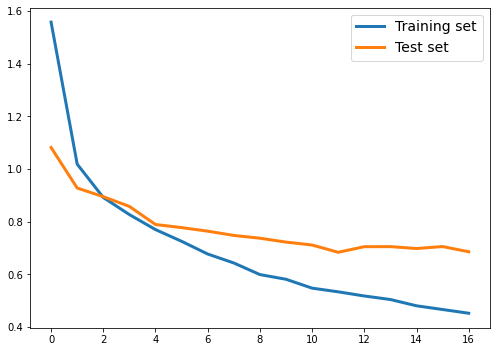

In [26]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.tight_layout()


#### <font color=black> Courbes correspondant aux précisions </font>

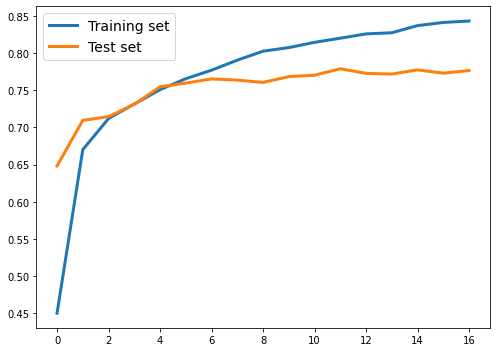

In [27]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['acc'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_acc'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.tight_layout()

#### <font color=black> Test du modèle sur des tweets </font>

In [17]:
#Tweet de la première catégorie
MAX_SEQUENCE_LENGTH = 140
MAX_NUM_WORDS = 20000

t=["b'Changing from one set of PJs into another *definitely* counts as getting dressed.'"]
sequences_test = tokenizer.texts_to_sequences(t)
print(sequences_test)
mi=len(sequences_test[0])
print(mi)
for i in range(mi, MAX_SEQUENCE_LENGTH):
    sequences_test[0].append(0)

y_pred = model_1.predict(sequences_test)
print(y_pred)

[[29, 69, 248, 11, 11743, 118, 484, 2918, 5323, 53, 427, 3812, 134]]
13
[[0.27622443 0.0045549  0.00879207 0.02589959 0.3535297  0.05593727
  0.07572719 0.01955612 0.12902029 0.05075831]]


In [19]:
#Tweet de la 9 ème catégorie
MAX_SEQUENCE_LENGTH = 140
MAX_NUM_WORDS = 20000

t=["b'Happy #PalindromeWeek from MoMath! Since it’s the 19th year of the century and the 9th month of the year, you can read the dates, numerically, the same backwards or forwards starting 9-10-19 through 9-19-19. Try it yourself!'"]
sequences_test = tokenizer.texts_to_sequences(t)
mi=len(sequences_test[0])
for i in range(mi, MAX_SEQUENCE_LENGTH):
    sequences_test[0].append(0)
  
y_pred = model_1.predict(sequences_test)
print(y_pred)

[[0.07359805 0.03443123 0.13141096 0.04945432 0.05106419 0.01288549
  0.0280723  0.02783977 0.10973669 0.481507  ]]


In [20]:
#Tweet de la 5 ème catégorie
MAX_SEQUENCE_LENGTH = 140
MAX_NUM_WORDS = 20000

t=["b'Kimchi hand-torn noodle soup!'"]
sequences_test = tokenizer.texts_to_sequences(t)
mi=len(sequences_test[0])
for i in range(mi, MAX_SEQUENCE_LENGTH):
    sequences_test[0].append(0)
  
y_pred = model_1.predict(sequences_test)
print(y_pred)

[[3.3526103e-05 9.2463451e-05 5.2192722e-06 6.4331660e-05 9.9694258e-01
  1.4146165e-05 2.3455559e-03 4.3193406e-05 1.5279870e-04 3.0616199e-04]]


## <font color=darkred> Même chose avec le texte néttoyé</font>

#### <font color=black> Ecriture de la nouvelle fonction get_text_labels_N() qui associe le texte nettoyé à son label</font>

In [42]:
import csv
def get_texts_labels_N():
    texts=[]
    labels=[]
    with open('tweet2_N.csv', newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            texts.append(row['texte_N'])
            labels.append(row['classe '])
    return texts, labels
        

#### <font color=black> Affichage des textes pour vérifier qu'ils sont bien nettoyés</font>

In [17]:
print(texts)

['Better together: lace & cutouts.', 'Too much of a good thing? Never. Buy 3, get 3 FREE panties on now. Excl. apply:', 'Does your bra collection need a refresh? Buy 2, get 1 FREE is on now. Excl. apply:', 'Everything’s falling into lace.', 'New bra tops work double-duty. Just add jeans.', 'When it comes to bra shape and comfort, fit is everything. Our design team explains how they use data from thousands of women to create designs that flatter curves and deliver confidence with every wear.', 'Thoughtfully designed. Beautifully understated.', 'Catch it while you can: buy 3, get 3 FREE panties is on now! Excl. apply:', "The feeling's neutral:", "Buy 2, get 1 FREE bras, aka the perfect time to stock up on the styles you've been eyeing. Excl. apply:", 'Treat yourself! Starting today, Feb. 29, through March 9, redeem your $20 reward card on a $50 purchase. Details:', "Your favorite T-shirt bra is now $25. Don't miss it:", 'Sun is setting on this offer! Enjoy **30% Off* the Victoria’s Secre

#### <font color=black> Séparition des données d'entrainement et de texte et mise en forme </font>

In [43]:
MAX_SEQUENCE_LENGTH = 140
MAX_NUM_WORDS = 20000

# first, prepare text samples and their labels

texts, labels = get_texts_labels_N()


# finally, vectorize the text samples into a 2D integer tensor
tokenizer = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)
word_index = tokenizer.word_index
data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH, padding='post')


# split the data into a training set and a validation set
ListLabel=['Fashion', 'Health', 'Tech', 'Sport', 'Cooking', 'Music', 'Videogames', 'Politic', 'Science', 'Cinema']
x_train = []
y_train =[]
x_val = []
y_val =[]
d_i=0
for label in ListLabel:
    data_label=[]
    vect=vector_label(label)
    label_vect=[]
    while (d_i<len(data) and labels[d_i]==label):
        data_label.append(data[d_i])
        label_vect.append(vect)
        d_i+=1
    np.random.shuffle(data_label)
    indice_separation=int(0.8*len(data_label))
    x_train+= data_label[0: indice_separation]
    y_train+= label_vect[0: indice_separation]
    x_val += data_label[indice_separation : len(data_label)]
    y_val += label_vect[indice_separation : len(data_label)]

x_train=np.array(x_train)
y_train=np.array(y_train)
x_val=np.array(x_val)
y_val=np.array(y_val)

print(x_val.shape)

num_words = MAX_NUM_WORDS
embedding_matrix = get_embedding_matrix(num_words, MAX_NUM_WORDS, word_index, file)

# load pre-trained word embeddings into an Embedding layer
embedding_layer = get_pre_trained_embedding_layer(num_words, embedding_matrix, MAX_SEQUENCE_LENGTH)


(3214, 140)
Indexing word vectors.
Found 1193514 word vectors.


#### <font color=black> Définition du model utilisé </font>

In [44]:
layer_out = Dense(units = (y_train.shape[1]), activation = 'softmax', name='topic', )

def get_model(embedding_layer, max_sequence_length, nb_labels, out):

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32', name='sequence')
    embedded_sequence = embedding_layer(sequence_input)
    
    x = Conv1D(128, 5, activation='relu', padding='same')(embedded_sequence)
    x = Dropout(0.5)(x)
    x = Conv1D(128, 5, activation='relu', padding='same')(x)
    x = Dropout(0.5)(x)
    x = Conv1D(128, 5, activation='relu', padding='same')(x)
    x = GlobalMaxPooling1D(data_format='channels_last')(x)
    
    topic_pred = out(x)

    model = Model(inputs=sequence_input, outputs=topic_pred, name='fully_conv_batchnorm')

    return model


def get_compiled_model(embedding_layer, max_sequence_length, nb_labels, out):
    model = get_model(embedding_layer, max_sequence_length, nb_labels, out)

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

    return model

model_2 =get_compiled_model(embedding_layer, MAX_SEQUENCE_LENGTH, len(labels), layer_out)
model_2.summary()

Model: "fully_conv_batchnorm"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequence (InputLayer)        [(None, 140)]             0         
_________________________________________________________________
embedded_sequence (Embedding (None, 140, 100)          2000000   
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 140, 128)          64128     
_________________________________________________________________
dropout_8 (Dropout)          (None, 140, 128)          0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 140, 128)          82048     
_________________________________________________________________
dropout_9 (Dropout)          (None, 140, 128)          0         
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 140, 128) 

#### <font color=black> Entrainement du modèle </font>

In [19]:
batch_size = 32
epochs = 70
earlyStopping = keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', patience=5, restore_best_weights=True)

history = model_2.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, callbacks=[earlyStopping], verbose=1, validation_data=(x_val, y_val))
score = model_2.evaluate(x_val, y_val, verbose=0)

Train on 12837 samples, validate on 3214 samples
Epoch 1/70
12837/12837 [==============================] - 8s 632us/sample - loss: 1.5050 - acc: 0.4737 - val_loss: 1.0363 - val_acc: 0.6689
Epoch 2/70
12837/12837 [==============================] - 7s 581us/sample - loss: 1.0192 - acc: 0.6671 - val_loss: 0.9223 - val_acc: 0.7082
Epoch 3/70
12837/12837 [==============================] - 7s 580us/sample - loss: 0.8967 - acc: 0.7101 - val_loss: 0.8880 - val_acc: 0.7147
Epoch 4/70
12837/12837 [==============================] - 8s 603us/sample - loss: 0.8320 - acc: 0.7265 - val_loss: 0.8429 - val_acc: 0.7315
Epoch 5/70
12837/12837 [==============================] - 7s 581us/sample - loss: 0.7707 - acc: 0.7474 - val_loss: 0.8117 - val_acc: 0.7452
Epoch 6/70
12837/12837 [==============================] - 8s 600us/sample - loss: 0.7169 - acc: 0.7665 - val_loss: 0.7751 - val_acc: 0.7498
Epoch 7/70
12837/12837 [==============================] - 8s 585us/sample - loss: 0.6712 - acc: 0.7809 - val_lo

#### <font color=black> Courbe des loss </font>

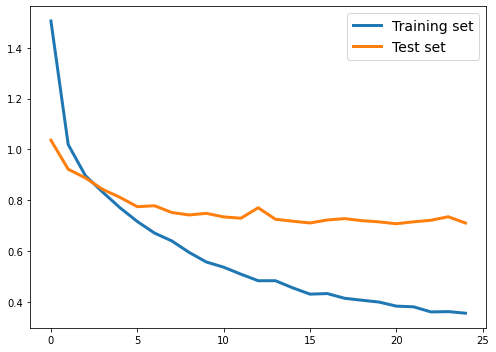

In [20]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.tight_layout()

#### <font color=black> Courbe des accuracy </font>

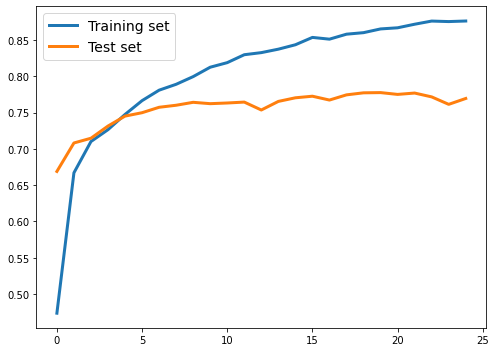

In [21]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['acc'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_acc'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.tight_layout()

## <font color=darkred> Obtension des résultats par catégorie</font>

#### <font color=black> Création des fonctions qui indiquent la précision, le rappel et le score_F1</font>

In [55]:
labels = ['Fashion', 'Health', 'Tech', 'Sport', 'Cooking', 'Music', 'Videogames', 'Politic', 'Science', 'Cinema']

class LabelWisePrecision(K.metrics.CategoricalAccuracy):
    def __init__(self, class_id, **kwargs):
        if 'name' not in kwargs:
            kwargs['name'] = f'{labels[class_id]}_P'
        super().__init__(**kwargs)
        
        self.class_id = class_id
    def update_state(self, y_true, y_pred, sample_weight=None):
        mask = tf.cast(tf.argmax(y_pred, axis=1) == self.class_id, tf.float32)
        if sample_weight is None:
            sample_weight = mask
        else:
            sample_weight *= mask
        super().update_state(y_true, y_pred, sample_weight=sample_weight)

class LabelWiseRecall(K.metrics.CategoricalAccuracy):
    def __init__(self, class_id, **kwargs):
        if 'name' not in kwargs:
            kwargs['name'] = f'{labels[class_id]}_R'
        super().__init__(**kwargs)
        
        self.class_id = class_id
    def update_state(self, y_true, y_pred, sample_weight=None):
        mask = tf.cast(tf.argmax(y_true, axis=1) == self.class_id, tf.float32)
        if sample_weight is None:
            sample_weight = mask
        else:
            sample_weight *= mask
        super().update_state(y_true, y_pred, sample_weight=sample_weight)
        
        
class LabelWiseF1(K.metrics.Metric):
    """Needs already instantiated precision and recall"""
    def __init__(self, label_wise_p, label_wise_r, **kwargs):
        assert label_wise_p.class_id == label_wise_r.class_id
        self.class_id = label_wise_p.class_id
        if 'name' not in kwargs:
            kwargs['name'] = f'{labels[self.class_id]}_F1'
        super().__init__(**kwargs)
        self.precision = label_wise_p
        self.recall    = label_wise_r
    def reset_states(self):
        pass
    def update_state(self, y_true, y_pred, sample_weight=None):
        pass
    
    def result(self):
        p = self.precision.result()
        r = self.recall.result()
        f1 = tf.math.divide_no_nan(2 * p * r, p + r)
        return f1

    
# on instancie les précisions et rappels pour chaque labels
precisions = [LabelWisePrecision(class_id=l) for l, _ in enumerate(labels)]
recalls    = [LabelWiseRecall   (class_id=l) for l, _ in enumerate(labels)]
# on instancie les F1 à partir de ces derniers
F1s = [LabelWiseF1(p, r) for p, r in zip(precisions, recalls)]


#### <font color=black> Modèle du texte nettoyé légèrement modifié pour qu'il affiche la précision, le rappel et le score_F1 par catégorie </font>

In [56]:
layer_out = Dense(units = (y_train.shape[1]), activation = 'softmax', name='topic', )

def get_model(embedding_layer, max_sequence_length, nb_labels, out):

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32', name='sequence')
    embedded_sequence = embedding_layer(sequence_input)
    
    x = Conv1D(128, 5, activation='relu', padding='same')(embedded_sequence)
    x = Dropout(0.5)(x)
    x = Conv1D(128, 5, activation='relu', padding='same')(x)
    x = Dropout(0.5)(x)
    x = Conv1D(128, 5, activation='relu', padding='same')(x)
    x = GlobalMaxPooling1D(data_format='channels_last')(x)
    
    topic_pred = out(x)

    model = Model(inputs=sequence_input, outputs=topic_pred, name='fully_conv_batchnorm')

    return model


def get_compiled_model(embedding_layer, max_sequence_length, nb_labels, out):
    model = get_model(embedding_layer, max_sequence_length, nb_labels, out)

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy'] + F1s + precisions + recalls)

    return model

model_3 =get_compiled_model(embedding_layer, MAX_SEQUENCE_LENGTH, len(labels), layer_out)
model_3.summary()

Model: "fully_conv_batchnorm"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequence (InputLayer)        [(None, 140)]             0         
_________________________________________________________________
embedded_sequence (Embedding (None, 140, 100)          2000000   
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 140, 128)          64128     
_________________________________________________________________
dropout_14 (Dropout)         (None, 140, 128)          0         
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 140, 128)          82048     
_________________________________________________________________
dropout_15 (Dropout)         (None, 140, 128)          0         
_________________________________________________________________
conv1d_23 (Conv1D)           (None, 140, 128) 

#### <font color=black> Entrainement du modèle </font>

In [90]:
batch_size = 32
epochs = 70
earlyStopping = keras.callbacks.EarlyStopping(monitor='val_categorical_accuracy', mode='max', patience=5, restore_best_weights=True)

history = model_3.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, callbacks=[earlyStopping], verbose=1, validation_data=(x_val, y_val))
score = model_3.evaluate(x_val, y_val, verbose=0)

Train on 12837 samples, validate on 3214 samples
Epoch 1/20
12837/12837 [==============================] - 7s 553us/sample - loss: 0.3866 - categorical_accuracy: 0.8661 - Fashion_F1: 0.8830 - Health_F1: 0.7669 - Tech_F1: 0.8005 - Sport_F1: 0.8055 - Cooking_F1: 0.8305 - Music_F1: 0.7840 - Videogames_F1: 0.7030 - Politic_F1: 0.7639 - Science_F1: 0.7136 - Cinema_F1: 0.7782 - Fashion_P: 0.8849 - Health_P: 0.7586 - Tech_P: 0.8263 - Sport_P: 0.7983 - Cooking_P: 0.8509 - Music_P: 0.7763 - Videogames_P: 0.6877 - Politic_P: 0.7639 - Science_P: 0.7202 - Cinema_P: 0.7739 - Fashion_R: 0.8811 - Health_R: 0.7755 - Tech_R: 0.7764 - Sport_R: 0.8129 - Cooking_R: 0.8111 - Music_R: 0.7918 - Videogames_R: 0.7190 - Politic_R: 0.7638 - Science_R: 0.7072 - Cinema_R: 0.7826 - val_loss: 0.7231 - val_categorical_accuracy: 0.7844 - val_Fashion_F1: 0.8842 - val_Health_F1: 0.7688 - val_Tech_F1: 0.8027 - val_Sport_F1: 0.8070 - val_Cooking_F1: 0.8317 - val_Music_F1: 0.7854 - val_Videogames_F1: 0.7049 - val_Politic_F

#### <font color=black> Courbe montrant l'evolution des différents paramètres au cours des époques par catégorie </font>

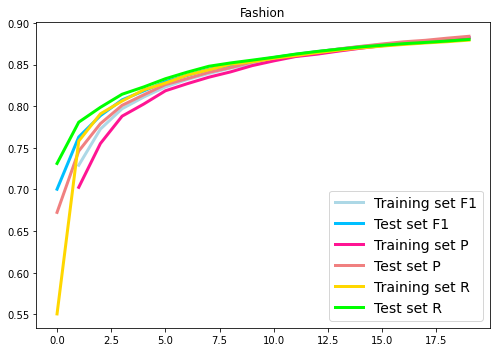

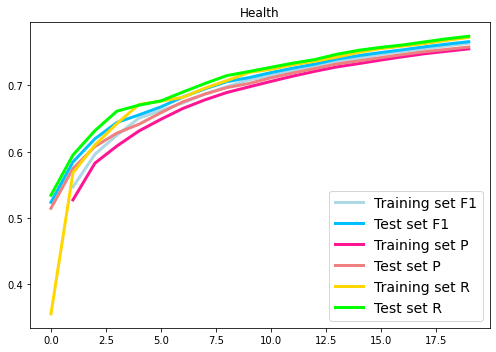

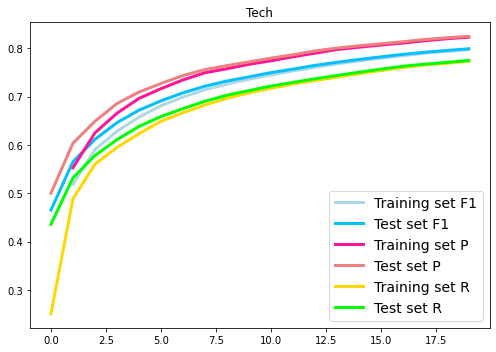

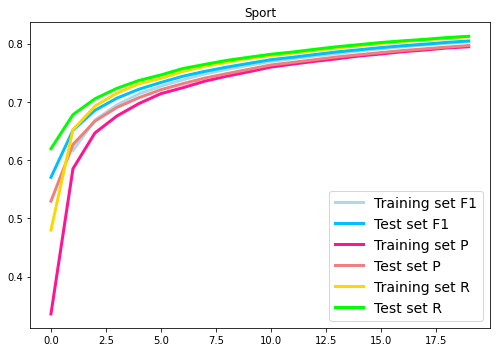

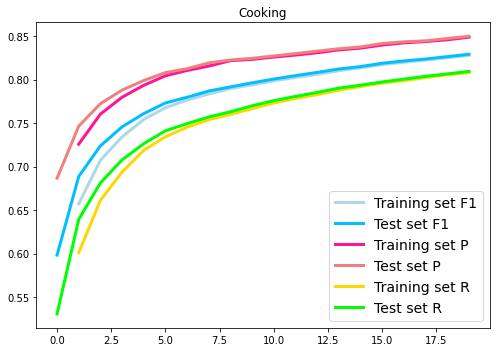

...

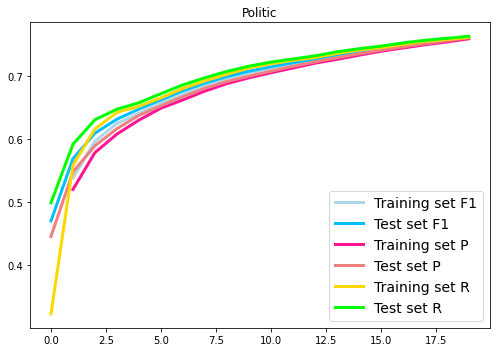

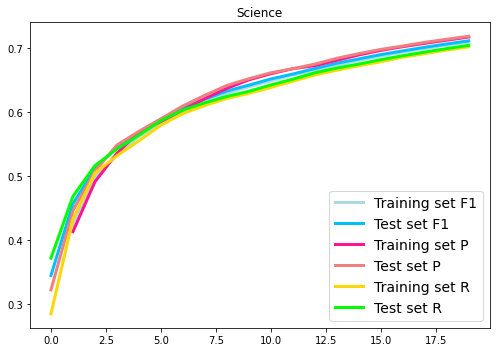

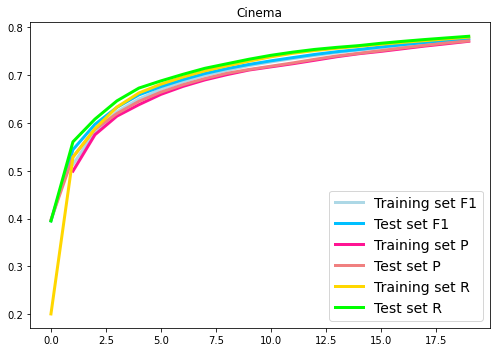

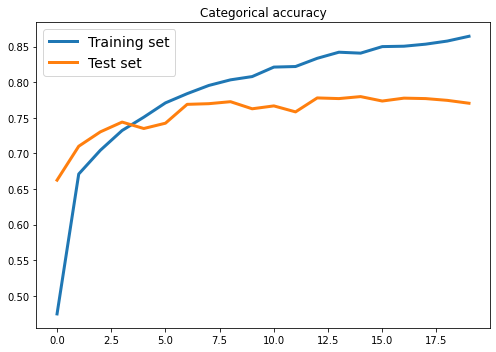

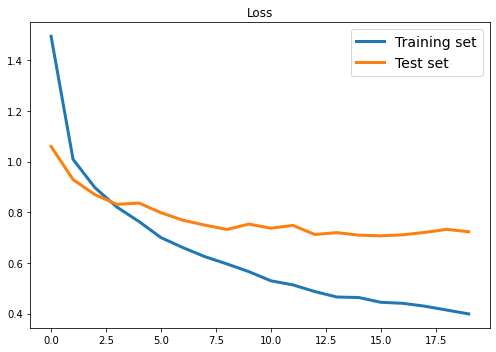

In [64]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Fashion_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Fashion_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Fashion_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Fashion_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Fashion_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Fashion_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Fashion')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Health_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Health_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Health_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Health_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Health_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Health_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Health')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Tech_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Tech_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Tech_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Tech_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Tech_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Tech_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Tech')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Sport_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Sport_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Sport_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Sport_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Sport_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Sport_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Sport')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Cooking_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Cooking_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Cooking_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Cooking_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Cooking_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Cooking_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Cooking')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Music_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Music_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Music_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Music_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Music_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Music_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Music')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Videogames_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Videogames_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Videogames_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Videogames_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Videogames_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Videogames_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Videogames')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Politic_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Politic_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Politic_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Politic_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Politic_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Politic_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Politic')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Science_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Science_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Science_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Science_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Science_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Science_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Science')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['Cinema_F1'], lw=3, label='Training set F1', c='lightblue')
plt.plot(history.epoch, history.history['val_Cinema_F1'], lw=3, label='Test set F1', c='deepskyblue')
plt.plot(history.epoch, history.history['Cinema_P'], lw=3, label='Training set P', c='deeppink')
plt.plot(history.epoch, history.history['val_Cinema_P'], lw=3, label='Test set P', c='lightcoral')
plt.plot(history.epoch, history.history['Cinema_R'], lw=3, label='Training set R', c='gold')
plt.plot(history.epoch, history.history['val_Cinema_R'], lw=3, label='Test set R', c='lime')
plt.legend(fontsize=14)
plt.title('Cinema')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['categorical_accuracy'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_categorical_accuracy'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.title('Categorical accuracy')
plt.tight_layout()

plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.title('Loss')
plt.tight_layout()

#### <font color=black> Comparaison des valeurs de précision, rappel et score_F1 en fonction de la catégorie lors de la dernière époque effectuée sur le jeu d'entrainement</font>

Text(0.5, 1.0, 'Training set')

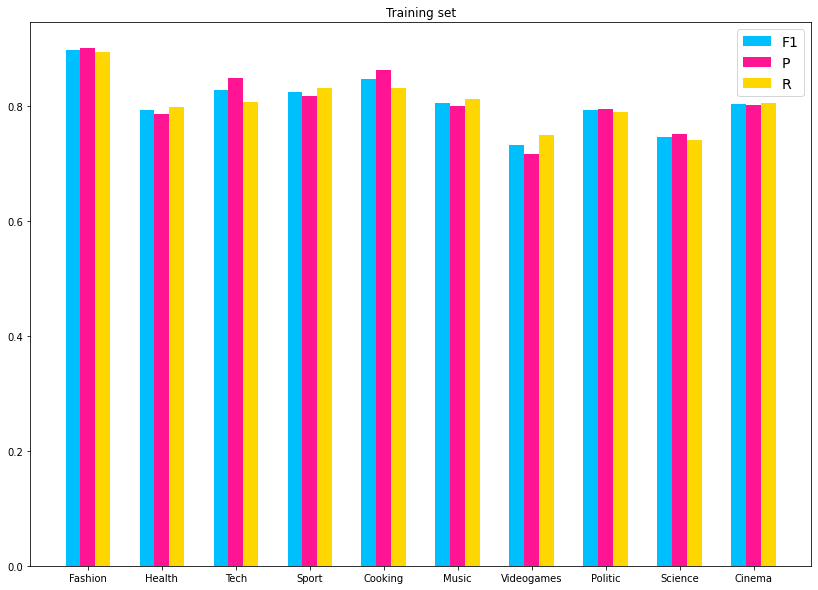

In [92]:
e=len(history.epoch)-1
labels = ['Fashion', 'Health', 'Tech', 'Sport', 'Cooking', 'Music', 'Videogames', 'Politic', 'Science', 'Cinema']
barWidth = 0.2
F1=[history.history['Fashion_F1'][e], history.history['Health_F1'][e], history.history['Tech_F1'][e], history.history['Sport_F1'][e], history.history['Cooking_F1'][e], history.history['Music_F1'][e], history.history['Videogames_F1'][e], history.history['Politic_F1'][e], history.history['Science_F1'][e], history.history['Cinema_F1'][e]]
P=[history.history['Fashion_P'][e], history.history['Health_P'][e], history.history['Tech_P'][e], history.history['Sport_P'][e], history.history['Cooking_P'][e], history.history['Music_P'][e], history.history['Videogames_P'][e], history.history['Politic_P'][e], history.history['Science_P'][e], history.history['Cinema_P'][e]]
R=[history.history['Fashion_R'][e], history.history['Health_R'][e], history.history['Tech_R'][e], history.history['Sport_R'][e], history.history['Cooking_R'][e], history.history['Music_R'][e], history.history['Videogames_R'][e], history.history['Politic_R'][e], history.history['Science_R'][e], history.history['Cinema_R'][e]]
r1 = range(len(F1))
r2 = [x + barWidth for x in r1]
r3 = [x + 2*barWidth for x in r1]

plt.figure(figsize=(14, 10))
plt.bar(r1, F1, width = barWidth, color = ['deepskyblue' for i in y1], linewidth = 2, label='F1')
plt.bar(r2, P, width = barWidth, color = ['deeppink' for i in y1], linewidth = 4, label='P')
plt.bar(r3, R, width = barWidth, color = ['gold' for i in y1], linewidth = 6, label='R')
plt.legend(fontsize=14)
plt.xticks([r + barWidth for r in range(len(F1))], labels)
plt.title('Training set')

#### <font color=black> Comparaison des valeurs de précision, rappel et score_F1 en fonction de la catégorie lors de la dernière époque effectuée sur le jeu de test</font>

Text(0.5, 1.0, 'Test set')

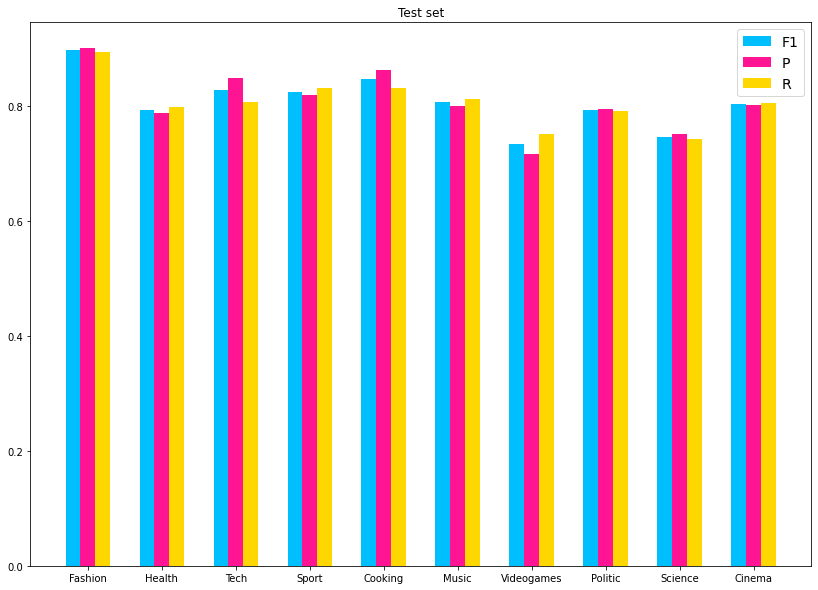

In [93]:
labels = ['Fashion', 'Health', 'Tech', 'Sport', 'Cooking', 'Music', 'Videogames', 'Politic', 'Science', 'Cinema']
barWidth = 0.2
F1=[history.history['val_Fashion_F1'][e], history.history['val_Health_F1'][e], history.history['val_Tech_F1'][e], history.history['val_Sport_F1'][e], history.history['val_Cooking_F1'][e], history.history['val_Music_F1'][e], history.history['val_Videogames_F1'][e], history.history['val_Politic_F1'][e], history.history['val_Science_F1'][e], history.history['val_Cinema_F1'][e]]
P=[history.history['val_Fashion_P'][e], history.history['val_Health_P'][e], history.history['val_Tech_P'][e], history.history['val_Sport_P'][e], history.history['val_Cooking_P'][e], history.history['val_Music_P'][e], history.history['val_Videogames_P'][e], history.history['val_Politic_P'][e], history.history['val_Science_P'][e], history.history['val_Cinema_P'][e]]
R=[history.history['val_Fashion_R'][e], history.history['val_Health_R'][e], history.history['val_Tech_R'][e], history.history['val_Sport_R'][e], history.history['val_Cooking_R'][e], history.history['val_Music_R'][e], history.history['val_Videogames_R'][e], history.history['val_Politic_R'][e], history.history['val_Science_R'][e], history.history['val_Cinema_R'][e]]
r1 = range(len(F1))
r2 = [x + barWidth for x in r1]
r3 = [x + 2*barWidth for x in r1]

plt.figure(figsize=(14, 10))
plt.bar(r1, F1, width = barWidth, color = ['deepskyblue' for i in y1], linewidth = 2, label='F1')
plt.bar(r2, P, width = barWidth, color = ['deeppink' for i in y1], linewidth = 4, label='P')
plt.bar(r3, R, width = barWidth, color = ['gold' for i in y1], linewidth = 6, label='R')
plt.legend(fontsize=14)
plt.xticks([r + barWidth  for r in range(len(F1))], labels)
plt.title('Test set')

## <font color=darkred> Création d'un générateur pour le texte</font>

#### <font color=black> Générateur de texte</font>

In [8]:
def vectorize_text_batch(text):
    sequences = tokenizer.texts_to_sequences(text)
    mi=len(sequences[0])
    for i in range(mi, MAX_SEQUENCE_LENGTH):
        sequences[0].append(0)
    return sequences

In [55]:
def train_t():
    dirs = os.listdir( "Images/" )
    i=0
    with open('tweet2_N.csv', newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            if row["url de l_image "]:
                if(i%5!=0):
                    texts = vectorize_text_batch([row['texte_N']])[0]
                    classe= row['classe ']
                    target = vector_label(classe)
                    yield (texts, target)
                i+=1


ds_train_t = tf.data.Dataset.from_generator(
    train_t,
    output_types=(tf.float32, tf.float32),
).shuffle(
    200
).padded_batch(
    32,
    padded_shapes=([140] , [10])
).prefetch(tf.data.experimental.AUTOTUNE)


def val_t():
    dirs = os.listdir( "Images/" )
    i=0
    with open('tweet2_N.csv', newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            if row["url de l_image "]:
                if(i%5==0):
                    texts = vectorize_text_batch([row['texte_N']])[0]
                    classe= row['classe ']
                    target = vector_label(classe)
                    yield (texts, target)
                i+=1
                    

ds_val_t = tf.data.Dataset.from_generator(
    val_t,
    output_types=(tf.float32, tf.float32),
).shuffle(
    200
).padded_batch(
    32,
    padded_shapes=([140] , [10])
).prefetch(tf.data.experimental.AUTOTUNE)

In [39]:
next(train_t())

([350,
  197,
  3,
  5,
  149,
  631,
  324,
  1394,
  91,
  38,
  91,
  184,
  7340,
  9,
  25,
  4907,
  604,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [46]:
next(val_t())

([195,
  201,
  3716,
  16355,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [40]:
next(iter(ds_train_t))

(<tf.Tensor: id=3840, shape=(32, 140), dtype=float32, numpy=
 array([[3.5000e+02, 1.9700e+02, 3.0000e+00, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4300e+02, 1.8000e+01, 4.9080e+03, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.6356e+04, 4.4240e+03, 8.4000e+01, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.3000e+01, 4.4270e+03, 4.4300e+02, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.8000e+01, 2.4000e+01, 1.4000e+02, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.3000e+01, 3.6000e+01, 1.7000e+01, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]], dtype=float32)>,
 <tf.Tensor: id=3841, shape=(32, 10), dtype=float32, numpy=
 array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0

In [47]:
next(iter(ds_val_t))

(<tf.Tensor: id=5984, shape=(32, 140), dtype=float32, numpy=
 array([[1.9500e+02, 2.0100e+02, 3.7160e+03, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [7.7000e+01, 2.3000e+01, 5.0600e+02, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1140e+03, 4.0900e+02, 5.2400e+02, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.0000e+00, 2.9980e+03, 1.1367e+04, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.0000e+00, 1.6414e+04, 1.7000e+02, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [5.0000e+00, 3.6800e+02, 1.5640e+03, ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]], dtype=float32)>,
 <tf.Tensor: id=5985, shape=(32, 10), dtype=float32, numpy=
 array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0

In [146]:
with open('tweet2_N.csv', newline='') as csvfile:
    print(vectorize_text_batch(next(csv.DictReader(csvfile))['texte_N']))

[[1105, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [910], [1033], [1033], [910], [1651], [], [1033], [2539], [2240], [910], [1033], [1226], [910], [1651], [], [], [3267], [5], [918], [910], [], [], [], [918], [143], [1033], [2539], [143], [1033], [160], []]


In [13]:
vectorize_text_batch(['lol ça va'])

[[3180,
  14493,
  10267,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0]]

#### <font color=black> Lancement de l'entrainement</font>

In [52]:
epochs = 150
earlyStopping = keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', patience=10, restore_best_weights=True)

history = model_2.fit(ds_train_t, epochs=epochs, callbacks=[earlyStopping], verbose=1, validation_data=ds_val_t)
score = model_2.evaluate(ds_val_t, verbose=0)

Epoch 1/150
223/223 [==============================] - 5s 21ms/step - loss: 0.5279 - acc: 0.8046 - val_loss: 0.0000e+00 - val_acc: 0.0000e+00
Epoch 2/150
223/223 [==============================] - 4s 18ms/step - loss: 0.5036 - acc: 0.8131 - val_loss: 1.1034 - val_acc: 0.6834
Epoch 3/150
223/223 [==============================] - 4s 18ms/step - loss: 0.4901 - acc: 0.8026 - val_loss: 1.0664 - val_acc: 0.6940
Epoch 4/150
223/223 [==============================] - 4s 19ms/step - loss: 0.4870 - acc: 0.8071 - val_loss: 1.0437 - val_acc: 0.7008
Epoch 5/150
223/223 [==============================] - 4s 18ms/step - loss: 0.4731 - acc: 0.8120 - val_loss: 1.0235 - val_acc: 0.7154
Epoch 6/150
223/223 [==============================] - 4s 18ms/step - loss: 0.4627 - acc: 0.8278 - val_loss: 0.9788 - val_acc: 0.7340
Epoch 7/150
223/223 [==============================] - 4s 18ms/step - loss: 0.4507 - acc: 0.8251 - val_loss: 1.0137 - val_acc: 0.7272
Epoch 8/150
223/223 [==============================] -

#### <font color=black> Courbe de loss</font>

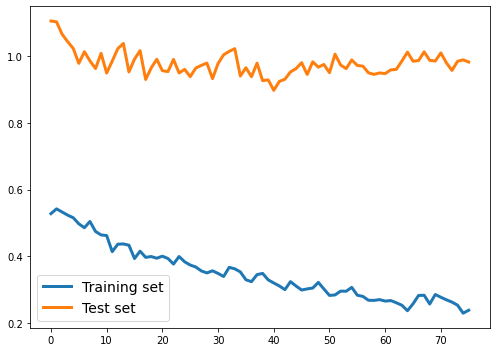

In [53]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.tight_layout()

#### <font color=black> Courbe d'accuracy</font>

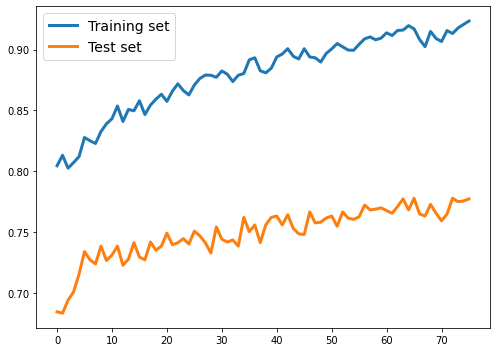

In [54]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['acc'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_acc'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.tight_layout()